<a href="https://colab.research.google.com/github/joanizba/stonks/blob/main/Proyecto_2_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import itertools
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
fees = pd.read_csv('/content/extract - fees - data analyst.csv')
cash_request = pd.read_csv('/content/extract - cash request - data analyst.csv')

In [ ]:
plt.figure(figsize=(10, 8))
fig1 = px.imshow(cash_request.isnull(),
color_continuous_scale=['black', 'red'],
labels=dict(color="NaN"),
title="Mapa de calor para cash_request")
fig1.update_layout(width=700, height=700)
fig1.update_coloraxes(showscale=False)
fig1.show()

<Figure size 1000x800 with 0 Axes>

In [ ]:
#separame por user_id y deleted_account_id
user_id_null = cash_request[cash_request['user_id'].isnull()]
deleted_account_id_null = cash_request[cash_request['deleted_account_id'].isnull()]

print(f"user:{user_id_null.iloc[10]}")
print("======")
print(f"user_delete:{deleted_account_id_null.iloc[10]}")

user:id                                                      633
amount                                                  1.0
status                                             rejected
created_at                    2020-02-07 14:38:16.934291+00
updated_at                    2020-02-07 17:02:15.625232+00
user_id                                                 NaN
moderated_at                  2020-02-07 15:20:05.730051+00
deleted_account_id                                    302.0
reimbursement_date            2020-03-08 14:38:16.933873+00
cash_request_received_date                              NaN
money_back_date                                         NaN
transfer_type                                       regular
send_at                                                 NaN
recovery_status                                         NaN
reco_creation                                           NaN
reco_last_update                                        NaN
Name: 45, dtype: object
user_delete

In [ ]:
fig2 = px.imshow(fees.isnull(),
color_continuous_scale=['black', 'red'],
labels=dict(color="NaN"),
title="Mapa de calor para fees")
fig2.update_layout(width=700, height=700)
fig2.update_coloraxes(showscale=False)
fig2.show()

In [ ]:
cash_request.describe()

,id,amount,user_id,deleted_account_id
count,23970.000000,23970.000000,21867.000000,2104.000000
mean,13910.966124,82.720818,32581.250789,9658.755228
std,7788.117214,26.528065,27618.565773,7972.743249
min,3.000000,1.000000,34.000000,91.000000
25%,7427.250000,50.000000,10804.000000,3767.000000
50%,14270.500000,100.000000,23773.000000,6121.500000
75%,20607.750000,100.000000,46965.000000,16345.000000
max,27010.000000,200.000000,103719.000000,30445.000000


In [ ]:
fees.describe()

,id,cash_request_id,total_amount
count,21061.000000,21057.000000,21061.000000
mean,10645.355111,16318.449162,5.000237
std,6099.315256,6656.149949,0.034453
min,1.000000,1456.000000,5.000000
25%,5385.000000,11745.000000,5.000000
50%,10652.000000,17160.000000,5.000000
75%,15925.000000,21796.000000,5.000000
max,21193.000000,27010.000000,10.000000


In [ ]:
columnas_cash_request=cash_request.columns.tolist()
for i in columnas_cash_request:
 print("===========================")
 print(f"{cash_request[i].value_counts().head(10)}")

id
5        1
15322    1
19569    1
15338    1
15329    1
15341    1
15336    1
15334    1
15165    1
15346    1
Name: count, dtype: int64
amount
100.0    16094
50.0      5304
25.0      1276
80.0       267
60.0       190
70.0       151
20.0       132
30.0       114
40.0       100
90.0        91
Name: count, dtype: int64
status
money_back               16397
rejected                  6568
direct_debit_rejected      831
active                      59
transaction_declined        48
direct_debit_sent           34
canceled                    33
Name: count, dtype: int64
created_at
2019-12-10 19:05:21.596873+00    1
2020-09-09 11:06:31.382449+00    1
2020-10-07 05:56:54.442506+00    1
2020-09-09 12:32:29.661278+00    1
2020-09-09 11:42:31.956338+00    1
2020-09-09 12:43:05.909299+00    1
2020-09-09 12:23:09.95394+00     1
2020-09-09 12:16:17.993242+00    1
2020-09-08 16:01:25.146577+00    1
2020-09-09 12:57:42.599222+00    1
Name: count, dtype: int64
updated_at
2019-12-11 16:47:42.40783+00  

In [ ]:
columnas_fees=fees.columns.tolist()
for i in columnas_fees:
 print("===========================")
 print(f"{fees[i].value_counts().head(10)}")

id
6537    1
7852    1
7846    1
7844    1
6968    1
7819    1
7816    1
7815    1
9183    1
7814    1
Name: count, dtype: int64
cash_request_id
12225.0    35
5006.0     28
4410.0     24
12452.0    23
11376.0    21
2358.0     19
11746.0    17
15319.0    16
4956.0     15
8713.0     15
Name: count, dtype: int64
type
instant_payment    11099
postpone            7766
incident            2196
Name: count, dtype: int64
status
accepted     14841
cancelled     4938
rejected      1194
confirmed       88
Name: count, dtype: int64
category
rejected_direct_debit     1599
month_delay_on_payment     597
Name: count, dtype: int64
total_amount
5.0     21060
10.0        1
Name: count, dtype: int64
reason
rejected direct debit               1599
month delay on payment - 9/2020      283
month delay on payment - 8/2020      203
month delay on payment - 10/2020     102
Postpone Cash Request 12225           34
Postpone Cash Request 5006            25
Postpone Cash Request 4410            23
Postpone Cash Re

In [ ]:
columnas_numericas_cash_request=cash_request.describe().columns.tolist()
for c in columnas_numericas_cash_request:
 fig = px.histogram(cash_request, x=c, title=f'Histograma de {c}')
 fig.update_layout(height=500)
 fig.show()

In [ ]:
columnas_numericas_fees=fees.describe().columns.tolist()
for c in columnas_numericas_fees:
 fig = px.histogram(fees, x=c, title=f'Histograma de {c}')
 fig.update_layout(height=500)
 fig.show()

In [ ]:
for c in columnas_cash_request:
  if c not in columnas_numericas_cash_request:
    counts = cash_request[c].value_counts()
    if len(counts)<=10:
      fig = px.pie(names=counts.index, values=counts.values,title=f'Distribución de {c}')
      fig.update_layout(height=500)
      fig.show()

In [ ]:
for c in columnas_fees:
  if c not in columnas_numericas_fees:
    counts = fees[c].value_counts()
    if len(counts)<=10:
      fig = px.pie(names=counts.index, values=counts.values,title=f'Distribución de {c}')
      fig.update_layout(height=500)
      fig.show()

In [ ]:
for c in columnas_numericas_cash_request:
 fig = px.box(cash_request, y=c, title=f'Boxplot de {c}')
 fig.update_layout(height=500)
 fig.show()

In [ ]:
for c in columnas_numericas_fees:
 fig = px.box(fees, y=c, title=f'Boxplot de {c}')
 fig.update_layout(height=500)
 fig.show()

In [ ]:
for c in columnas_numericas_cash_request:
 fig = px.violin(cash_request, y=c, title=f'Violinplot de {c}')
 fig.update_layout(height=500)
 fig.show()

In [ ]:
for c in columnas_numericas_fees:
 fig = px.violin(fees, y=c, title=f'Violinplot de {c}')
 fig.update_layout(height=500)
 fig.show()

In [ ]:
for c1, c2 in itertools.combinations(columnas_numericas_cash_request, 2):
 fig = px.scatter(cash_request, x=c1, y=c2, title=f'Gráfico de dispersión de␣{c1} vs {c2}')
 fig.update_layout(height=500)
 fig.show()

In [ ]:
for c1, c2 in itertools.combinations(columnas_numericas_fees, 2):
 fig = px.scatter(fees, x=c1, y=c2, title=f'Gráfico de dispersión de␣{c1} vs {c2}')
 fig.update_layout(height=500)
 fig.show()

In [ ]:
for c1, c2 in itertools.combinations(columnas_numericas_cash_request, 2):
    fig = px.scatter(cash_request, x=c1, y=c2,
                     title=f'Gráfico de dispersión de {c1} vs {c2} con línea de tendencia',
                     trendline="ols")  # Agregar línea de tendencia (OLS)

    # Cambiar el color de la línea de tendencia a rojo
    fig.update_traces(line=dict(color='red', width=3))  # Color y ancho de la línea de tendencia
    fig.update_traces(line=dict(color='red'), selector=dict(mode='lines'))  # Cambiar el color de la línea de tendencia
    fig.update_layout(height=500)
    fig.show()

In [ ]:
for c1, c2 in itertools.combinations(columnas_numericas_fees, 2):
    fig = px.scatter(fees, x=c1, y=c2,
                     title=f'Gráfico de dispersión de {c1} vs {c2} con línea de tendencia',
                     trendline="ols")  # Agregar línea de tendencia (OLS)

    # Cambiar el color de la línea de tendencia a rojo
    fig.update_traces(line=dict(color='red', width=3))  # Color y ancho de la línea de tendencia
    fig.update_traces(line=dict(color='red'), selector=dict(mode='lines'))  # Cambiar el color de la línea de tendencia
    fig.update_layout(height=500)
    fig.show()

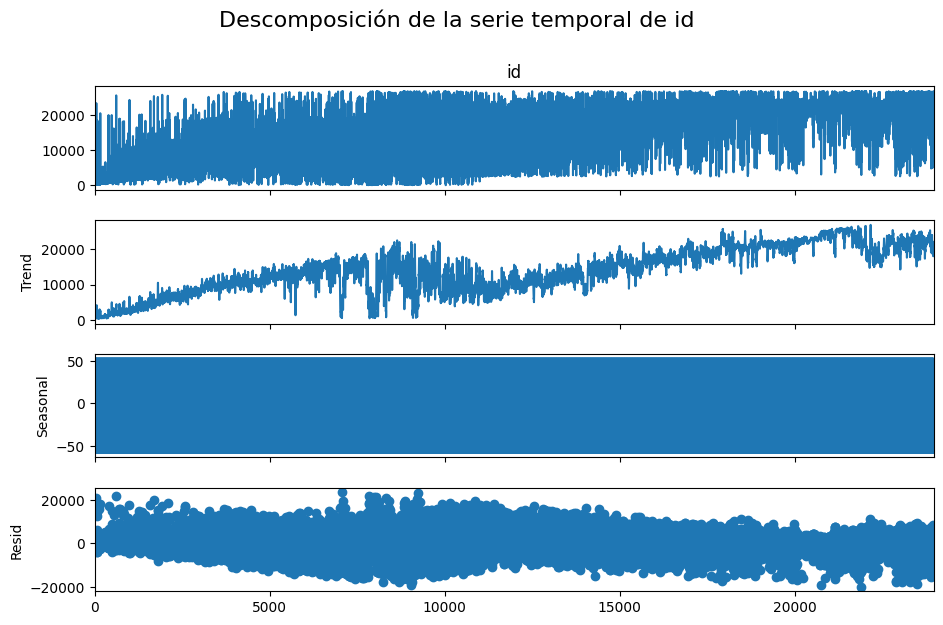

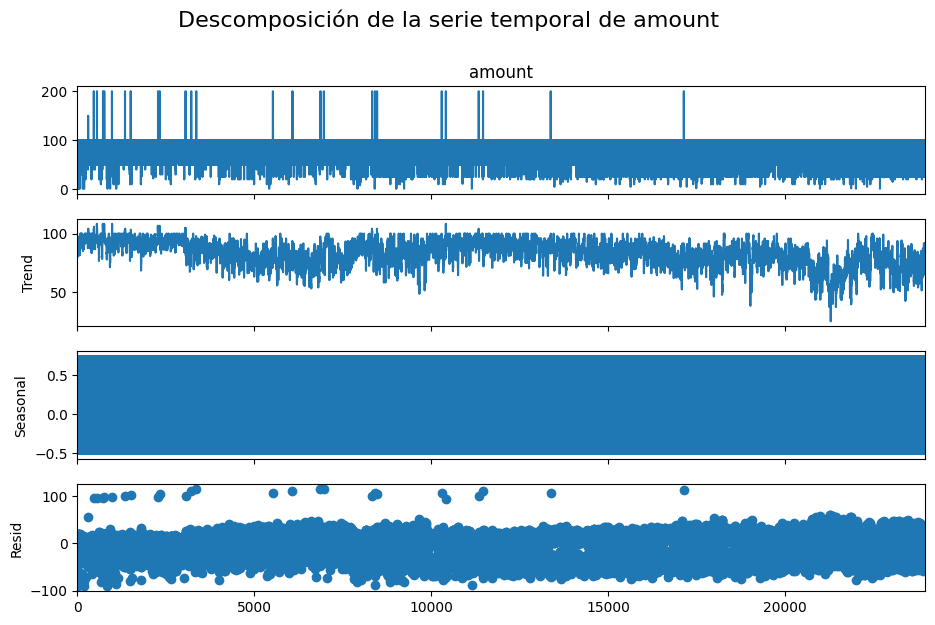

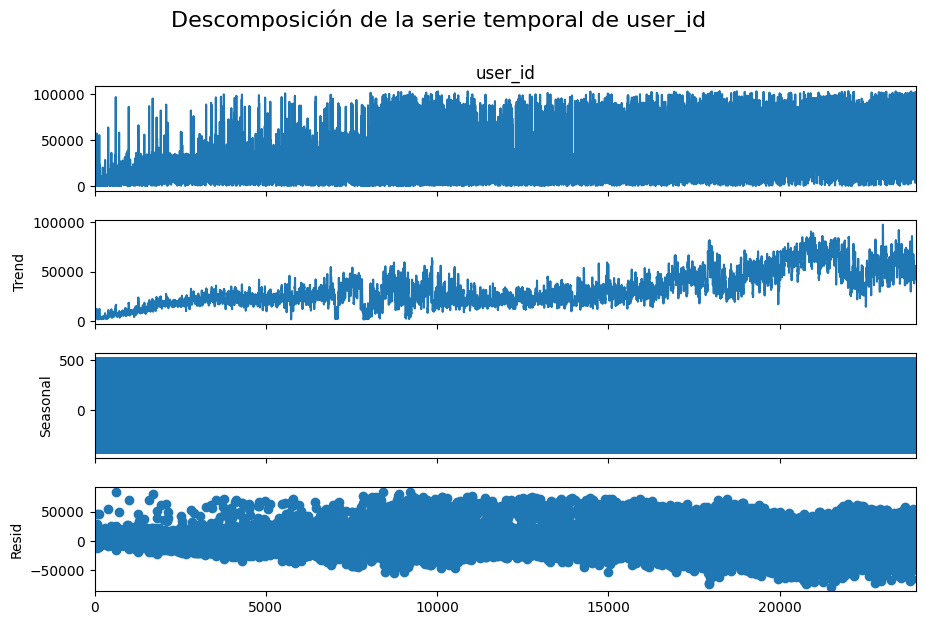

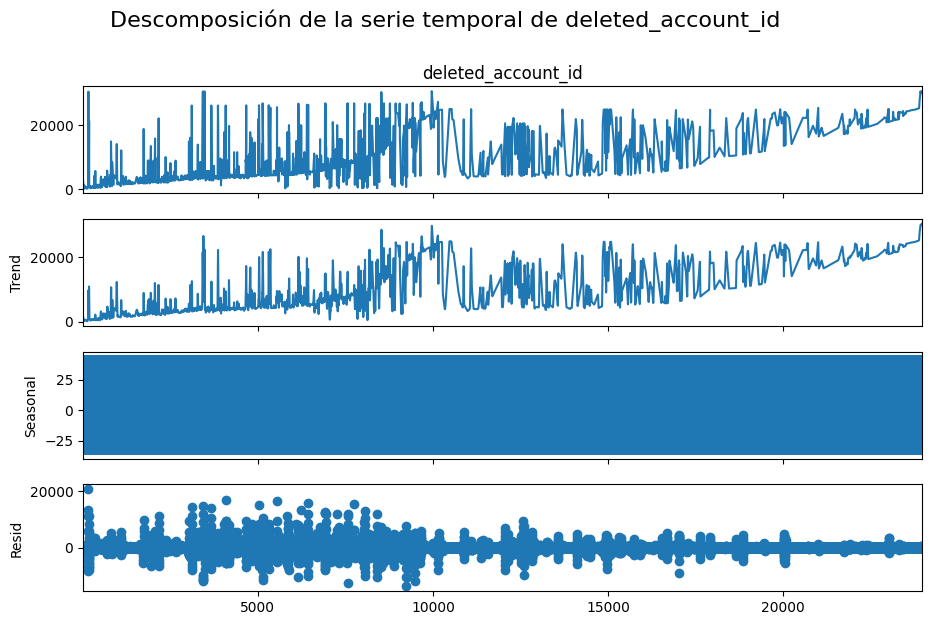

In [ ]:
for c in columnas_numericas_cash_request:

  cash_request_copy = cash_request[c].copy()
  if cash_request_copy.isnull().any():
      cash_request_copy = cash_request_copy.interpolate()
  cash_request_copy = cash_request_copy.dropna()


  if not np.isfinite(cash_request_copy).all():
    print(f'La columna {c} contiene valores no finitos, se omite la descomposición.')

  descomposicion = seasonal_decompose(cash_request_copy, model='additive',period=12)

  fig = descomposicion.plot()

  plt.gcf().set_size_inches(10, 6)

  fig.suptitle(f'Descomposición de la serie temporal de {c}', fontsize=16,y=1.05)
  plt.show()

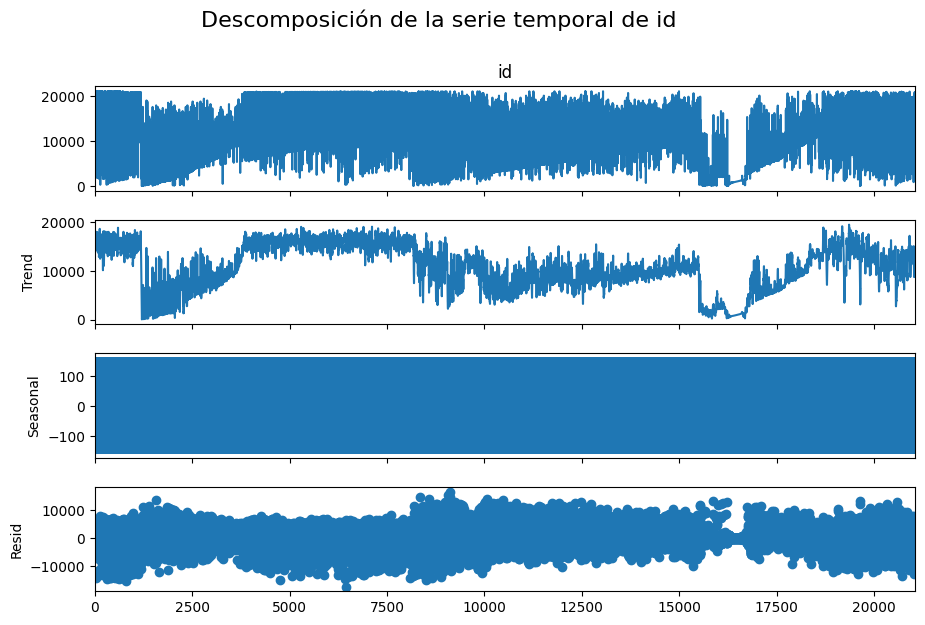

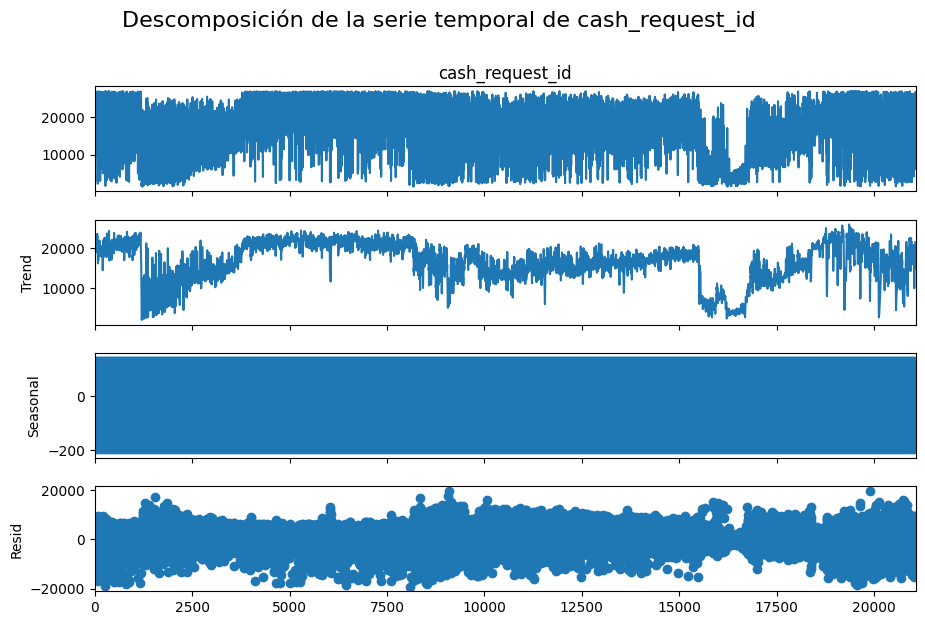

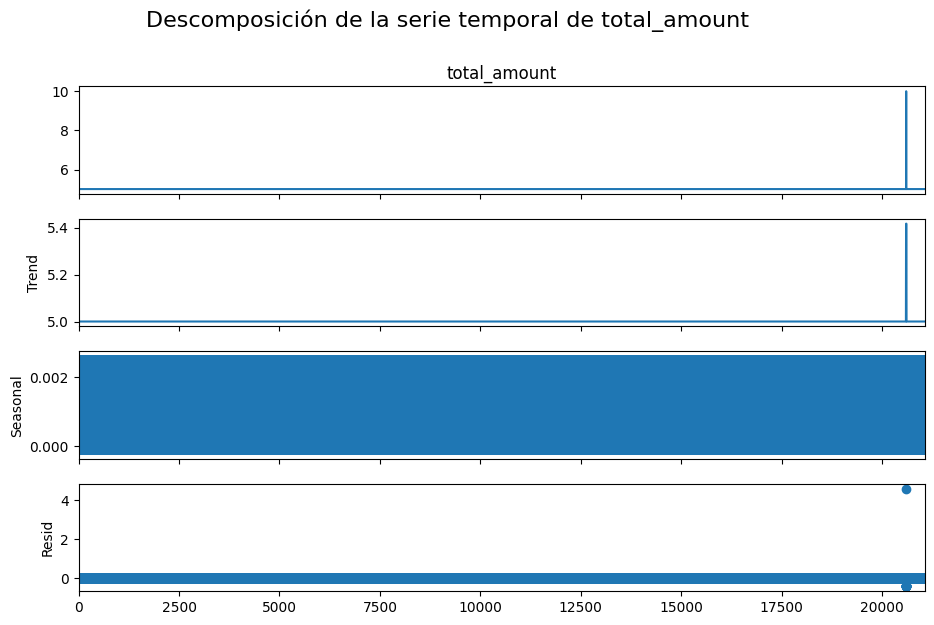

In [ ]:
for c in columnas_numericas_fees:

  fees_copy = fees[c].copy()
  if fees_copy.isnull().any():
      fees_copy = fees_copy.interpolate()
  fees_copy = fees_copy.dropna()
  if not np.isfinite(fees_copy).all():
    print(f'La columna {c} contiene valores no finitos, se omite la descomposición.')

  descomposicion = seasonal_decompose(fees_copy, model='additive',period=12)

  fig = descomposicion.plot()
  plt.gcf().set_size_inches(10,6)
  fig.suptitle(f'Descomposición de la serie temporal de {c}', fontsize=16,y=1.05)
  plt.show()

In [ ]:
cr = cash_request.copy()
cr = cr[["amount","created_at","user_id","deleted_account_id","transfer_type"]]
cr.fillna({"user_id": cr["deleted_account_id"]}, inplace=True)
cr.drop(columns=["deleted_account_id"], inplace=True)
cr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23970 entries, 0 to 23969
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   amount         23970 non-null  float64
 1   created_at     23970 non-null  object 
 2   user_id        23970 non-null  float64
 3   transfer_type  23970 non-null  object 
dtypes: float64(2), object(2)
memory usage: 749.2+ KB


In [ ]:
cr['created_at'] = pd.to_datetime(cr['created_at'])
cr['created_at'] = cr['created_at'].dt.tz_localize(None)
cr['Mes'] = cr['created_at'].dt.to_period('M')

In [ ]:
cr['Cohorte'] = cr.groupby('user_id')['created_at'].transform('min').dt.to_period('M')
cohorte_siszes_initial = cr.groupby('Cohorte').agg(Num_clientes_ini=('user_id', 'nunique')).reset_index()
cohorte_siszes_initial

,Cohorte,Num_clientes_ini
0,2019-11,1
1,2019-12,254
2,2020-01,106
3,2020-02,90
4,2020-03,86
5,2020-04,246
6,2020-05,432
7,2020-06,1540
8,2020-07,1482
9,2020-08,728


In [ ]:
cohorte_siszes_monthly = cr.groupby(['Cohorte','Mes']).agg(Num_clientes=('user_id', 'nunique')).reset_index()
cohorte_siszes_monthly

,Cohorte,Mes,Num_clientes
0,2019-11,2019-11,1
1,2019-11,2019-12,1
2,2019-11,2020-04,1
3,2019-11,2020-05,1
4,2019-11,2020-08,1
...,...,...,...
78,2020-09,2020-10,680
79,2020-09,2020-11,20
80,2020-10,2020-10,4802
81,2020-10,2020-11,15


In [ ]:
cohorte_cash_monthly = cr.groupby(['Cohorte','Mes']).agg(Num_soli=('user_id', 'count')).reset_index()
cohorte_cash_monthly

,Cohorte,Mes,Num_soli
0,2019-11,2019-11,1
1,2019-11,2019-12,1
2,2019-11,2020-04,1
3,2019-11,2020-05,1
4,2019-11,2020-08,1
...,...,...,...
78,2020-09,2020-10,727
79,2020-09,2020-11,20
80,2020-10,2020-10,5043
81,2020-10,2020-11,15


In [ ]:
retention_clientes = cohorte_siszes_monthly.pivot_table(index='Cohorte', columns='Mes', values='Num_clientes')
retention_clientes = retention_clientes.div(cohorte_siszes_initial.set_index('Cohorte')['Num_clientes_ini'], axis=0)
retention_clientes

Mes,2019-11,2019-12,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11
Cohorte,,,,,,,,,,,,,
2019-11,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,1.000000,1.000000,1.000000,NaN
2019-12,NaN,1.0,0.354331,0.228346,0.267717,0.263780,0.295276,0.287402,0.232283,0.263780,0.169291,0.244094,0.003937
2020-01,NaN,NaN,1.000000,0.207547,0.150943,0.254717,0.254717,0.254717,0.264151,0.198113,0.188679,0.226415,0.009434
2020-02,NaN,NaN,NaN,1.000000,0.500000,0.466667,0.466667,0.433333,0.433333,0.400000,0.277778,0.377778,NaN
2020-03,NaN,NaN,NaN,NaN,1.000000,0.441860,0.430233,0.523256,0.418605,0.395349,0.337209,0.313953,0.011628
2020-04,NaN,NaN,NaN,NaN,NaN,1.000000,0.471545,0.495935,0.373984,0.325203,0.308943,0.247967,NaN
2020-05,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.590278,0.506944,0.430556,0.340278,0.356481,0.009259
2020-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.490909,0.482468,0.372727,0.367532,0.003247
2020-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.474359,0.344804,0.359649,0.004723


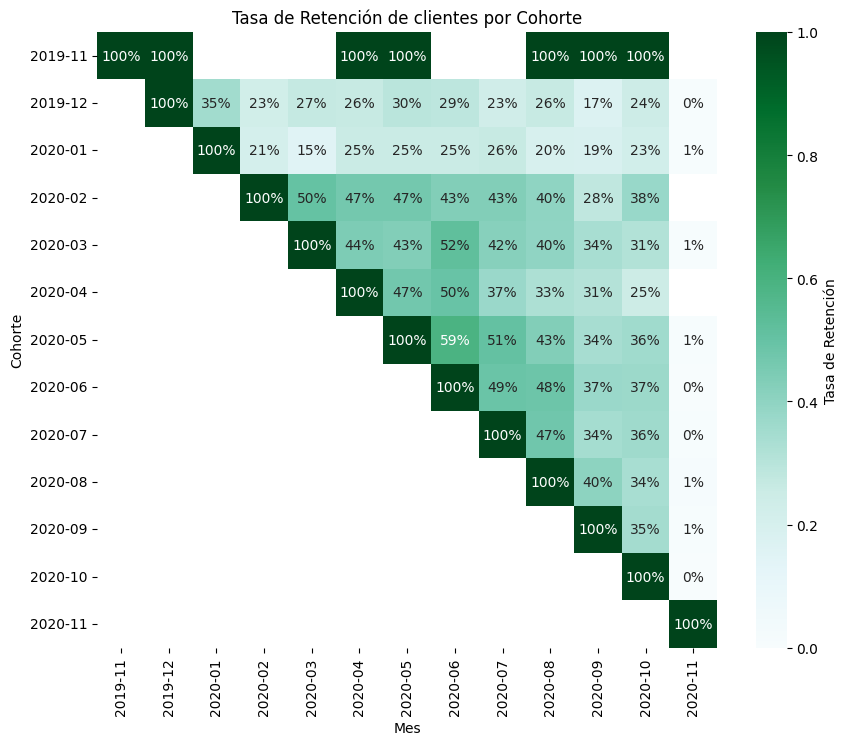

In [ ]:
plt.figure(figsize=(10, 8))
plt.title('Tasa de Retención de clientes por Cohorte')
sns.heatmap(retention_clientes, annot=True, fmt='.0%',vmin=0.0,vmax=1.0,cmap='BuGn', cbar_kws={'label': 'Tasa de Retención'})
plt.show()

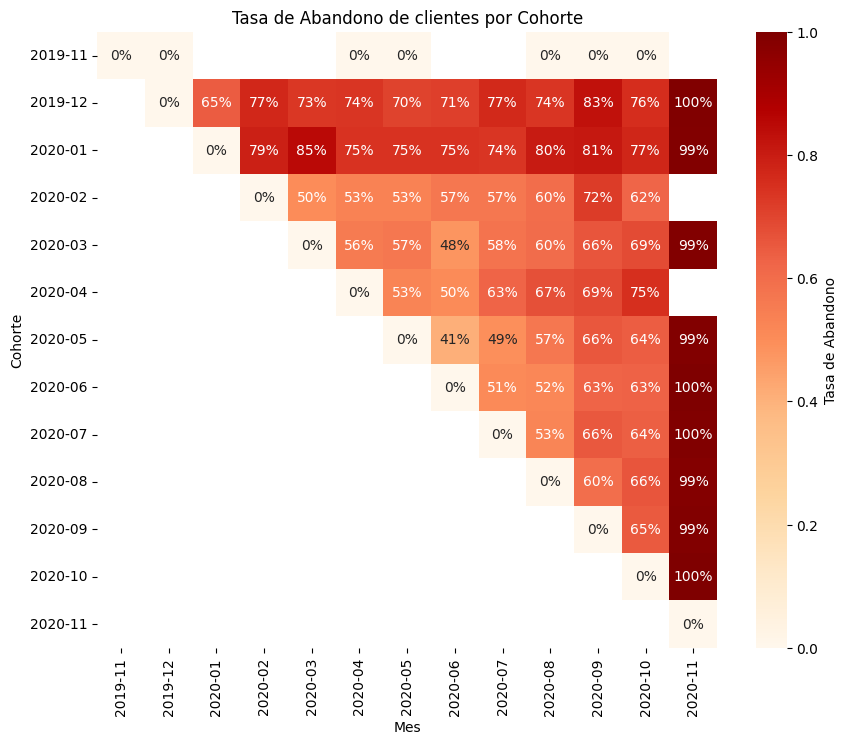

In [ ]:
churn_clientes = 1 - retention_clientes
plt.figure(figsize=(10, 8))
plt.title('Tasa de Abandono de clientes por Cohorte')
sns.heatmap(churn_clientes, annot=True, fmt='.0%',vmin=0.0,vmax=1.0,cmap='OrRd', cbar_kws={'label': 'Tasa de Abandono'})
plt.show()

In [ ]:
cohorte_cash_initial = cohorte_cash_monthly.groupby('Cohorte').first().reset_index().rename(columns={'Num_soli': 'Num_soli_ini'})
cohorte_cash_initial

,Cohorte,Mes,Num_soli_ini
0,2019-11,2019-11,1
1,2019-12,2019-12,288
2,2020-01,2020-01,117
3,2020-02,2020-02,97
4,2020-03,2020-03,99
5,2020-04,2020-04,264
6,2020-05,2020-05,478
7,2020-06,2020-06,1934
8,2020-07,2020-07,1996
9,2020-08,2020-08,993


In [ ]:
retention_cash = cohorte_cash_monthly.pivot_table(index='Cohorte', columns='Mes', values='Num_soli')
retention_cash = retention_cash.div(cohorte_cash_initial.set_index('Cohorte')['Num_soli_ini'], axis=0)
retention_cash

Mes,2019-11,2019-12,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11
Cohorte,,,,,,,,,,,,,
2019-11,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,1.000000,1.000000,2.000000,NaN
2019-12,NaN,1.0,0.368056,0.218750,0.274306,0.284722,0.298611,0.315972,0.250000,0.291667,0.184028,0.260417,0.003472
2020-01,NaN,NaN,1.000000,0.205128,0.145299,0.299145,0.264957,0.247863,0.264957,0.188034,0.188034,0.213675,0.008547
2020-02,NaN,NaN,NaN,1.000000,0.505155,0.505155,0.463918,0.463918,0.463918,0.453608,0.278351,0.412371,NaN
2020-03,NaN,NaN,NaN,NaN,1.000000,0.424242,0.464646,0.474747,0.404040,0.363636,0.303030,0.303030,0.010101
2020-04,NaN,NaN,NaN,NaN,NaN,1.000000,0.568182,0.571970,0.439394,0.405303,0.337121,0.284091,NaN
2020-05,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.665272,0.573222,0.485356,0.376569,0.364017,0.008368
2020-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.531024,0.494829,0.355222,0.339193,0.002585
2020-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.471443,0.304609,0.298096,0.003507


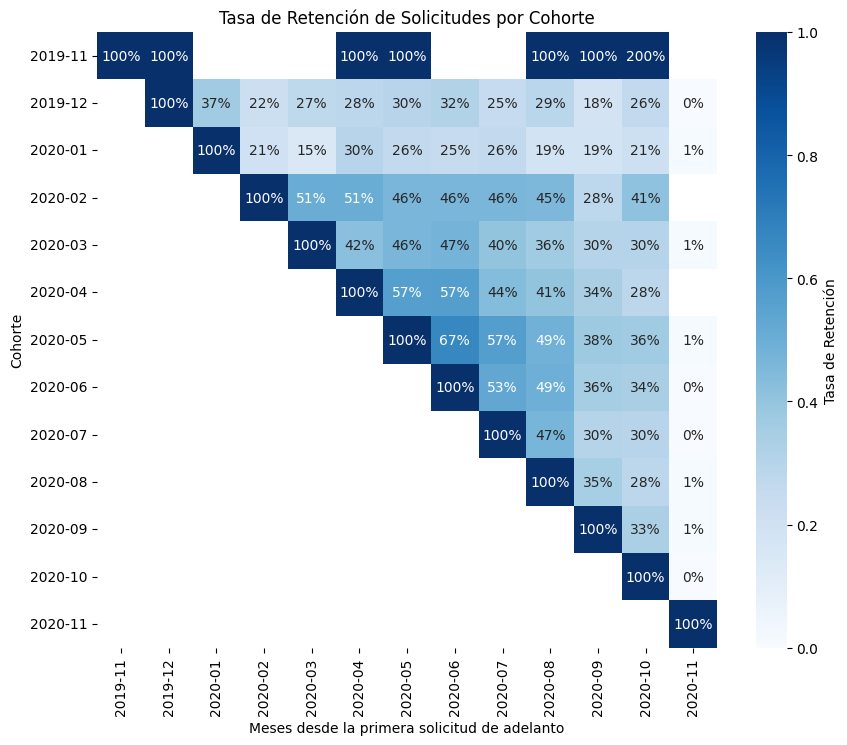

In [ ]:
plt.figure(figsize=(10, 8))
plt.title('Tasa de Retención de Solicitudes por Cohorte')
sns.heatmap(retention_cash, annot=True, fmt='.0%',vmin=0.0,vmax=1.0,cmap='Blues', cbar_kws={'label': 'Tasa de Retención'})
plt.xlabel('Meses desde la primera solicitud de adelanto')
plt.ylabel('Cohorte')
plt.show()

In [ ]:
churn_cash = 1 - retention_cash
churn_cash

Mes,2019-11,2019-12,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11
Cohorte,,,,,,,,,,,,,
2019-11,0.0,0.0,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,0.000000,0.000000,-1.000000,NaN
2019-12,NaN,0.0,0.631944,0.781250,0.725694,0.715278,0.701389,0.684028,0.750000,0.708333,0.815972,0.739583,0.996528
2020-01,NaN,NaN,0.000000,0.794872,0.854701,0.700855,0.735043,0.752137,0.735043,0.811966,0.811966,0.786325,0.991453
2020-02,NaN,NaN,NaN,0.000000,0.494845,0.494845,0.536082,0.536082,0.536082,0.546392,0.721649,0.587629,NaN
2020-03,NaN,NaN,NaN,NaN,0.000000,0.575758,0.535354,0.525253,0.595960,0.636364,0.696970,0.696970,0.989899
2020-04,NaN,NaN,NaN,NaN,NaN,0.000000,0.431818,0.428030,0.560606,0.594697,0.662879,0.715909,NaN
2020-05,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.334728,0.426778,0.514644,0.623431,0.635983,0.991632
2020-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.468976,0.505171,0.644778,0.660807,0.997415
2020-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.528557,0.695391,0.701904,0.996493


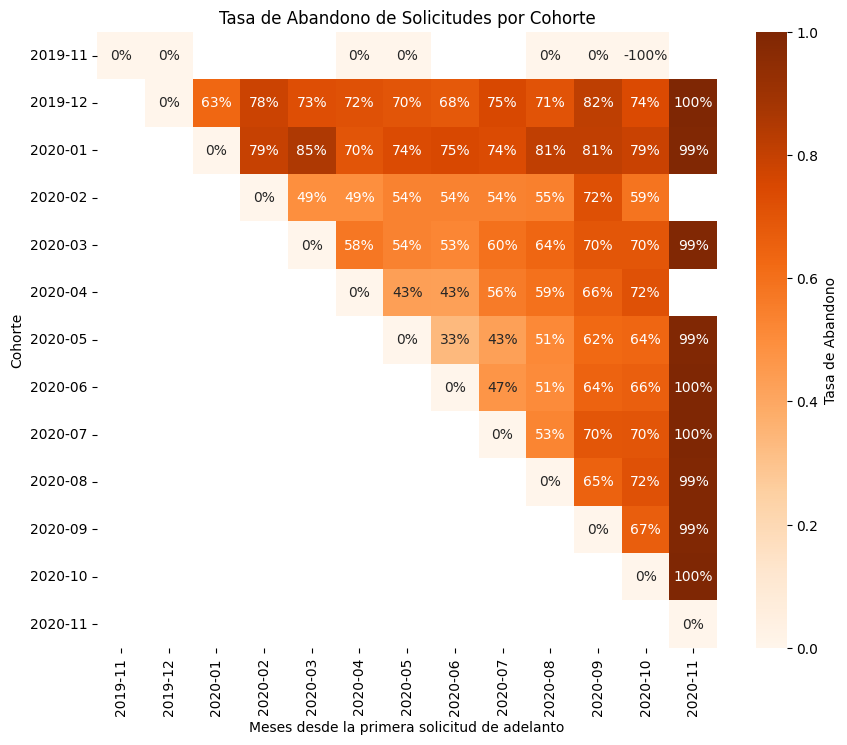

In [ ]:
plt.figure(figsize=(10, 8))
plt.title('Tasa de Abandono de Solicitudes por Cohorte')
sns.heatmap(churn_cash, annot=True, fmt='.0%',vmin=0.0,vmax=1.0,cmap='Oranges', cbar_kws={'label': 'Tasa de Abandono'})
plt.xlabel('Meses desde la primera solicitud de adelanto')
plt.ylabel('Cohorte')
plt.show()

In [ ]:
fs = fees.copy()
fs = fs[["cash_request_id", "total_amount","created_at"]]
fs['created_at'] = pd.to_datetime(fs['created_at'])
fs['created_at'] = fs['created_at'].dt.tz_localize(None)
fs['Mes'] = fs['created_at'].dt.to_period('M')

In [ ]:
fs['Cohorte'] = fs.groupby('cash_request_id')['created_at'].transform('min').dt.to_period('M')
cohorte_fees_initial = fs.groupby('Cohorte').agg(Num_tarifas_iniciales=('cash_request_id', 'nunique')).reset_index()
cohorte_fees_initial

,Cohorte,Num_tarifas_iniciales
0,2020-05,14
1,2020-06,447
2,2020-07,856
3,2020-08,1922
4,2020-09,2640
5,2020-10,6930
6,2020-11,124


In [ ]:
cohorte_fees_monthly = fs.groupby(['Cohorte','Mes']).agg(Num_tarifas=('cash_request_id', 'nunique')).reset_index()
cohorte_fees_monthly

,Cohorte,Mes,Num_tarifas
0,2020-05,2020-05,14
1,2020-05,2020-06,5
2,2020-05,2020-07,2
3,2020-05,2020-08,1
4,2020-05,2020-09,1
5,2020-05,2020-10,1
6,2020-06,2020-06,447
7,2020-06,2020-07,196
8,2020-06,2020-08,74
9,2020-06,2020-09,42


In [ ]:
retention_fees = cohorte_fees_monthly.pivot_table(index='Cohorte', columns='Mes', values='Num_tarifas')
retention_fees = retention_fees.div(cohorte_fees_initial.set_index('Cohorte')['Num_tarifas_iniciales'], axis=0)
retention_fees

Mes,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11
Cohorte,,,,,,,
2020-05,1.0,0.357143,0.142857,0.071429,0.071429,0.071429,NaN
2020-06,NaN,1.000000,0.438479,0.165548,0.093960,0.082774,NaN
2020-07,NaN,NaN,1.000000,0.371495,0.200935,0.143692,NaN
2020-08,NaN,NaN,NaN,1.000000,0.356400,0.197190,NaN
2020-09,NaN,NaN,NaN,NaN,1.000000,0.360985,0.006439
2020-10,NaN,NaN,NaN,NaN,NaN,1.000000,0.014286
2020-11,NaN,NaN,NaN,NaN,NaN,NaN,1.000000


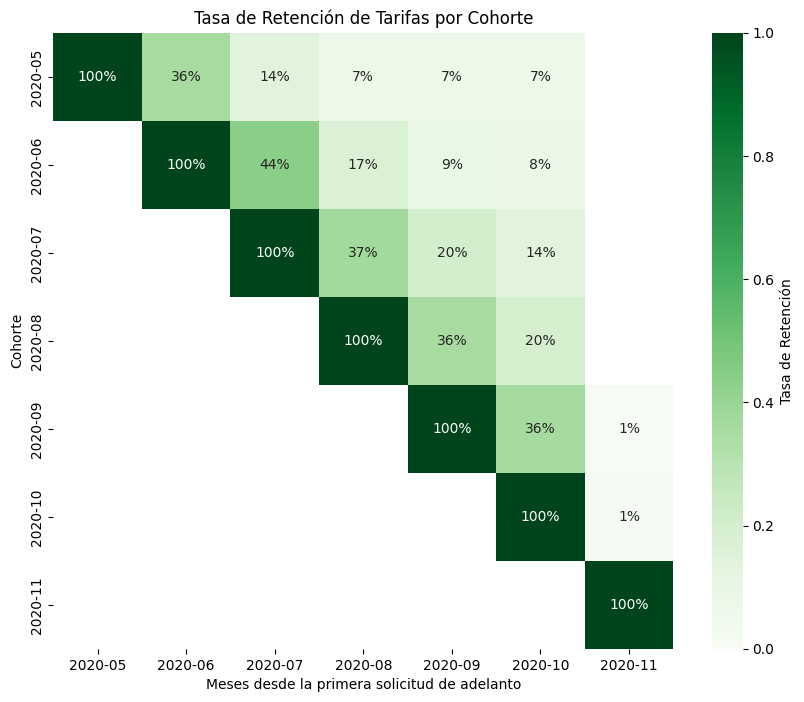

In [ ]:
plt.figure(figsize=(10, 8))
plt.title('Tasa de Retención de Tarifas por Cohorte')
sns.heatmap(retention_fees, annot=True, fmt='.0%',vmin=0.0,vmax=1.0,cmap='Greens', cbar_kws={'label': 'Tasa de Retención'})
plt.xlabel('Meses desde la primera solicitud de adelanto')
plt.ylabel('Cohorte')
plt.show()

In [ ]:
churn_fees = 1 - retention_fees
churn_fees

Mes,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11
Cohorte,,,,,,,
2020-05,0.0,0.642857,0.857143,0.928571,0.928571,0.928571,NaN
2020-06,NaN,0.000000,0.561521,0.834452,0.906040,0.917226,NaN
2020-07,NaN,NaN,0.000000,0.628505,0.799065,0.856308,NaN
2020-08,NaN,NaN,NaN,0.000000,0.643600,0.802810,NaN
2020-09,NaN,NaN,NaN,NaN,0.000000,0.639015,0.993561
2020-10,NaN,NaN,NaN,NaN,NaN,0.000000,0.985714
2020-11,NaN,NaN,NaN,NaN,NaN,NaN,0.000000


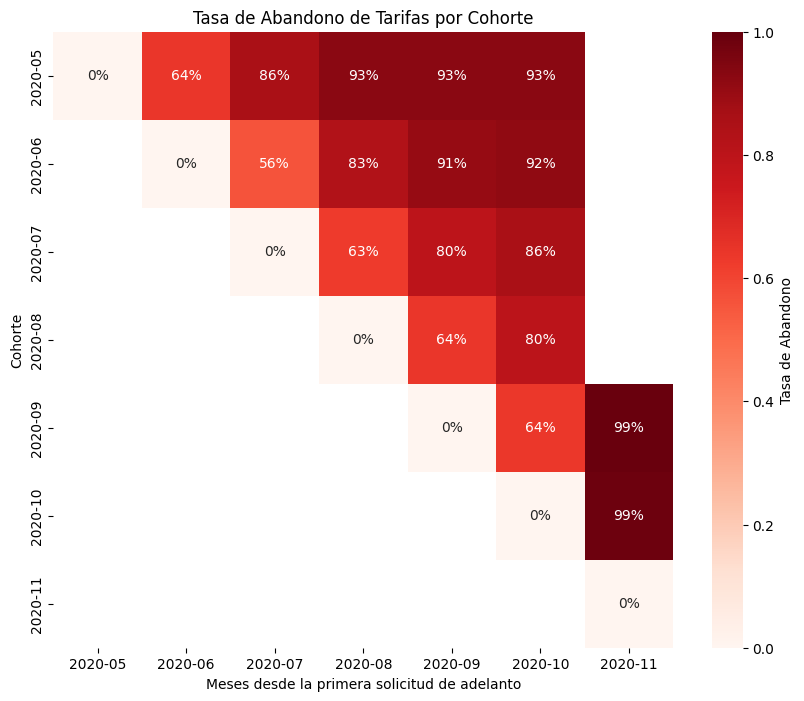

In [ ]:
plt.figure(figsize=(10, 8))
plt.title('Tasa de Abandono de Tarifas por Cohorte')
sns.heatmap(churn_fees, annot=True, fmt='.0%',vmin=0.0,vmax=1.0,cmap='Reds', cbar_kws={'label': 'Tasa de Abandono'})
plt.xlabel('Meses desde la primera solicitud de adelanto')
plt.ylabel('Cohorte')
plt.show()

In [ ]:
cr['Semana_Mes'] = cr['created_at'].dt.strftime('%U_%B') + '_' + cr['Mes'].dt.strftime('%Y')
cr['Dia_Semana'] = cr['created_at'].dt.strftime('%A') + '_' + cr['Semana_Mes']
cr['Hora_Dia'] = cr['created_at'].dt.hour.astype(str) + '_' + cr['Dia_Semana']

In [ ]:
cohort_revenue = cr.groupby(['Cohorte', 'Mes'])['amount'].sum().reset_index()
cohort_revenue = cohort_revenue.pivot(index='Cohorte', columns='Mes',values='amount')
cohort_revenue

Mes,2019-11,2019-12,2020-01,2020-02,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11
Cohorte,,,,,,,,,,,,,
2019-11,1.0,100.0,NaN,NaN,NaN,100.0,10.0,NaN,NaN,10.0,5.0,6.0,NaN
2019-12,NaN,27197.0,10123.0,5881.0,7650.0,7900.0,8175.0,8805.0,6990.0,7790.0,4860.0,6655.0,100.0
2020-01,NaN,NaN,11464.0,2360.0,1660.0,3500.0,3020.0,2770.0,3010.0,2150.0,1970.0,2350.0,100.0
2020-02,NaN,NaN,NaN,8412.0,4740.0,4607.0,4350.0,4235.0,4405.0,4130.0,2555.0,3595.0,NaN
2020-03,NaN,NaN,NaN,NaN,9499.0,4250.0,4540.0,4850.0,4055.0,3390.0,2800.0,2700.0,50.0
2020-04,NaN,NaN,NaN,NaN,NaN,25736.0,14258.0,14320.0,11000.0,9915.0,7685.0,6450.0,NaN
2020-05,NaN,NaN,NaN,NaN,NaN,NaN,44883.0,30143.0,25725.0,21224.0,16350.0,15305.0,350.0
2020-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,180903.0,92672.0,84491.0,60025.0,56525.0,400.0
2020-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,180330.0,76873.0,49725.0,47313.0,500.0


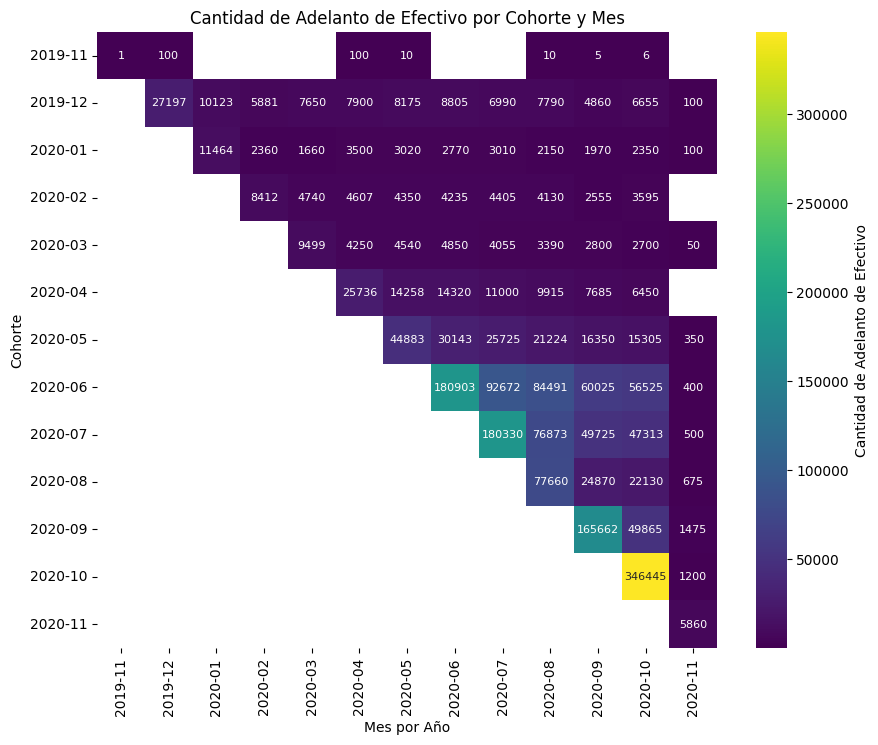

In [ ]:
plt.figure(figsize=(10, 8))
plt.title('Cantidad de Adelanto de Efectivo por Cohorte y Mes')
sns.heatmap(data=cohort_revenue, annot=True, fmt='.0f', cmap='viridis',annot_kws={"size": 8}, cbar_kws={'label': 'Cantidad de Adelanto de Efectivo'})
plt.xlabel('Mes por Año')
plt.ylabel('Cohorte')
plt.show()

In [ ]:
cohort_amount_2020_03 = cr[cr['Cohorte'] == '2020-03'].groupby('user_id')['amount'].sum().reset_index()
cohort_amount_2020_03

,user_id,amount
0,161.0,400.0
1,400.0,800.0
2,447.0,100.0
3,448.0,80.0
4,475.0,100.0
...,...,...
81,13975.0,650.0
82,14798.0,650.0
83,16345.0,400.0
84,21228.0,200.0


In [ ]:
sort_cohort_amount_2020_03 = cohort_amount_2020_03.sort_values(by='amount',ascending=False)
top_10_users = sort_cohort_amount_2020_03.head(10)
top_10_users

,user_id,amount
36,3377.0,1305.0
52,4297.0,1200.0
45,3617.0,1000.0
50,3948.0,950.0
20,2548.0,900.0
43,3557.0,900.0
9,680.0,850.0
77,4715.0,800.0
1,400.0,800.0
6,496.0,750.0


In [ ]:
amount_2020_03 = cr[cr['Cohorte'] == '2020-03'].groupby(['user_id','Mes'])['amount'].sum().reset_index()
cohort_amount_2020_03_top10 = amount_2020_03[amount_2020_03['user_id'].isin(top_10_users['user_id'])]
cohort_amount_2020_03_top10 = cohort_amount_2020_03_top10.pivot(index='user_id', columns='Mes', values='amount')
cohort_amount_2020_03_top10

Mes,2020-03,2020-04,2020-05,2020-06,2020-07,2020-08,2020-09,2020-10,2020-11
user_id,,,,,,,,,
400.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,NaN
496.0,150.0,NaN,100.0,100.0,100.0,100.0,100.0,100.0,NaN
680.0,200.0,100.0,100.0,100.0,100.0,100.0,100.0,50.0,NaN
2548.0,100.0,100.0,100.0,100.0,100.0,200.0,NaN,200.0,NaN
3377.0,300.0,150.0,270.0,200.0,185.0,100.0,50.0,NaN,50.0
3557.0,200.0,200.0,NaN,200.0,200.0,100.0,NaN,NaN,NaN
3617.0,200.0,NaN,200.0,100.0,200.0,100.0,100.0,100.0,NaN
3948.0,200.0,200.0,200.0,100.0,NaN,100.0,NaN,150.0,NaN
4297.0,200.0,200.0,200.0,200.0,200.0,100.0,100.0,NaN,NaN


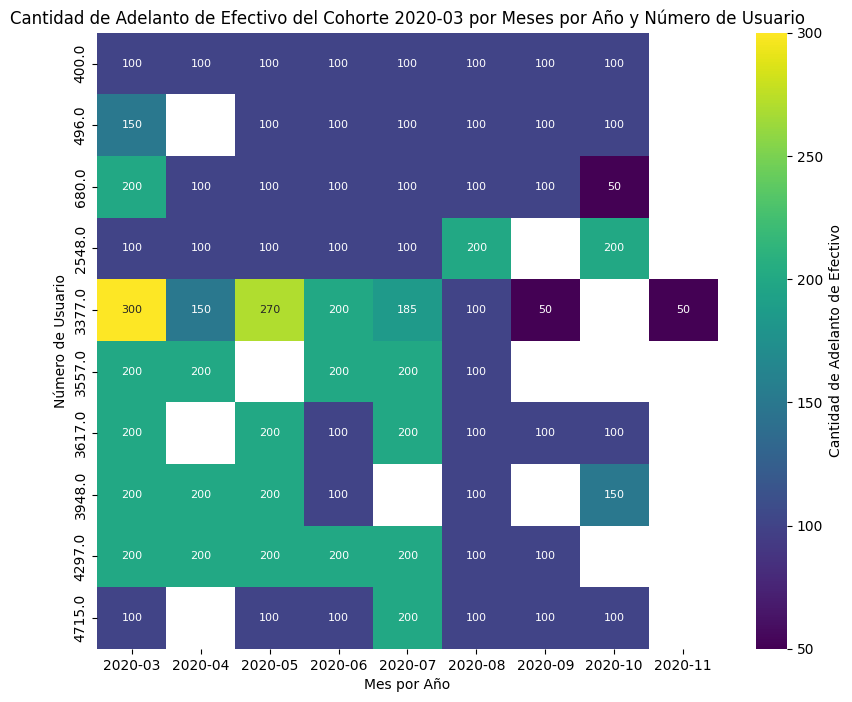

In [ ]:
plt.figure(figsize=(10, 8))
plt.title('Cantidad de Adelanto de Efectivo del Cohorte 2020-03 por Meses por Año y Número de Usuario')
sns.heatmap(data=cohort_amount_2020_03_top10, annot=True, fmt='.0f',cmap='viridis', annot_kws={"size": 8}, cbar_kws={'label': 'Cantidad de Adelanto de Efectivo'})
plt.xlabel('Mes por Año')
plt.ylabel('Número de Usuario')
plt.show()

In [ ]:
cohort_weekly_amount = cr[cr['Cohorte'] == '2020-03'].groupby(['user_id','Semana_Mes'])['amount'].sum().reset_index()
cohort_weekly_amount

,user_id,Semana_Mes,amount
0,161.0,09_March_2020,100.0
1,161.0,14_April_2020,100.0
2,161.0,19_May_2020,100.0
3,161.0,23_June_2020,100.0
4,400.0,10_March_2020,100.0
...,...,...,...
362,16345.0,31_August_2020,100.0
363,16345.0,36_September_2020,100.0
364,21228.0,13_March_2020,100.0
365,21228.0,32_August_2020,100.0


In [ ]:
cohort_weekly_amount_top10 = cohort_weekly_amount[cohort_weekly_amount['user_id'].isin(top_10_users['user_id'])]
cohort_weekly_amount_top10 = cohort_weekly_amount_top10.pivot(index='user_id', columns='Semana_Mes', values='amount')
cohort_weekly_amount_top10

Semana_Mes,09_March_2020,10_March_2020,11_March_2020,12_March_2020,13_April_2020,14_April_2020,15_April_2020,16_April_2020,18_May_2020,19_May_2020,...,33_August_2020,34_August_2020,35_August_2020,35_September_2020,36_September_2020,37_September_2020,40_October_2020,41_October_2020,43_October_2020,44_November_2020
user_id,,,,,,,,,,,,,,,,,,,,,
400.0,NaN,100.0,NaN,NaN,NaN,100.0,NaN,NaN,100.0,NaN,...,NaN,NaN,NaN,NaN,NaN,100.0,100.0,NaN,NaN,NaN
496.0,NaN,100.0,50.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,100.0,NaN,NaN,100.0,NaN,NaN
680.0,100.0,NaN,100.0,NaN,NaN,100.0,NaN,NaN,NaN,100.0,...,NaN,NaN,NaN,100.0,NaN,NaN,50.0,NaN,NaN,NaN
2548.0,100.0,NaN,NaN,NaN,NaN,NaN,100.0,NaN,100.0,NaN,...,NaN,NaN,100.0,NaN,NaN,NaN,100.0,NaN,100.0,NaN
3377.0,NaN,100.0,100.0,100.0,50.0,NaN,NaN,100.0,100.0,50.0,...,NaN,NaN,NaN,50.0,NaN,NaN,NaN,NaN,NaN,50.0
3557.0,NaN,200.0,NaN,NaN,NaN,200.0,NaN,NaN,NaN,NaN,...,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3617.0,200.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,100.0,NaN,NaN,NaN,100.0,NaN,NaN
3948.0,NaN,NaN,100.0,100.0,100.0,NaN,NaN,100.0,NaN,100.0,...,NaN,100.0,NaN,NaN,NaN,NaN,50.0,NaN,100.0,NaN
4297.0,NaN,NaN,200.0,NaN,200.0,NaN,NaN,NaN,NaN,200.0,...,NaN,NaN,NaN,NaN,NaN,100.0,NaN,NaN,NaN,NaN


In [ ]:
cohort_weekly_amount_top10 = cohort_weekly_amount_top10.loc[:,cohort_weekly_amount_top10.columns[:10]]
cohort_weekly_amount_top10

Semana_Mes,09_March_2020,10_March_2020,11_March_2020,12_March_2020,13_April_2020,14_April_2020,15_April_2020,16_April_2020,18_May_2020,19_May_2020
user_id,,,,,,,,,,
400.0,NaN,100.0,NaN,NaN,NaN,100.0,NaN,NaN,100.0,NaN
496.0,NaN,100.0,50.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
680.0,100.0,NaN,100.0,NaN,NaN,100.0,NaN,NaN,NaN,100.0
2548.0,100.0,NaN,NaN,NaN,NaN,NaN,100.0,NaN,100.0,NaN
3377.0,NaN,100.0,100.0,100.0,50.0,NaN,NaN,100.0,100.0,50.0
3557.0,NaN,200.0,NaN,NaN,NaN,200.0,NaN,NaN,NaN,NaN
3617.0,200.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3948.0,NaN,NaN,100.0,100.0,100.0,NaN,NaN,100.0,NaN,100.0
4297.0,NaN,NaN,200.0,NaN,200.0,NaN,NaN,NaN,NaN,200.0


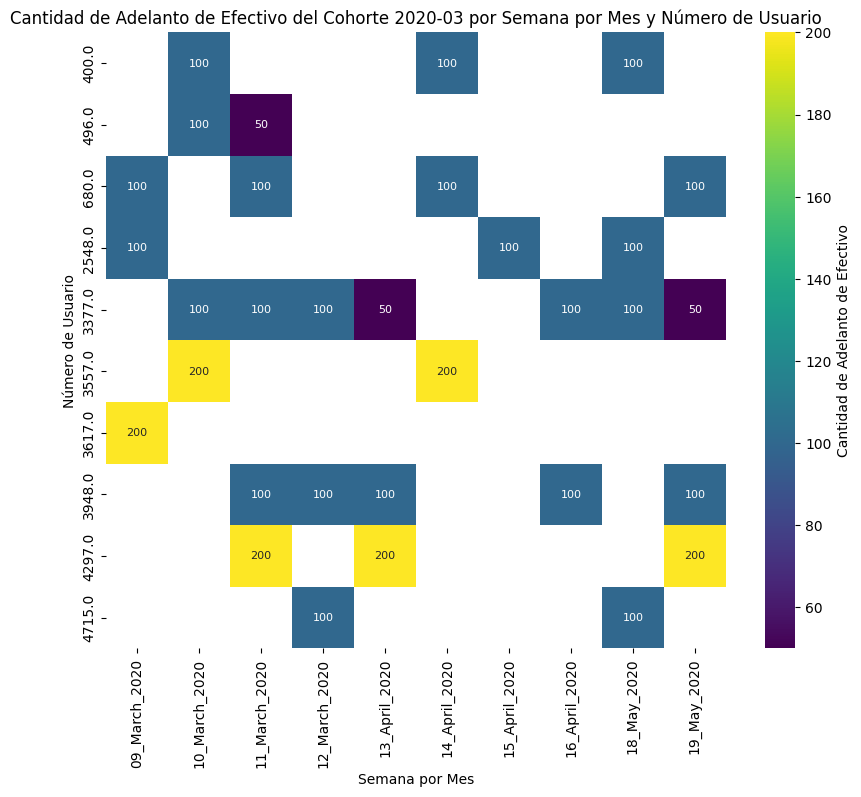

In [ ]:
plt.figure(figsize=(10, 8))
plt.title('Cantidad de Adelanto de Efectivo del Cohorte 2020-03 por Semana por Mes y Número de Usuario')
sns.heatmap(data=cohort_weekly_amount_top10, annot=True, fmt='.0f', cmap='viridis', annot_kws={"size": 8}, cbar_kws={'label': 'Cantidad de Adelanto de Efectivo'})
plt.xlabel('Semana por Mes')
plt.ylabel('Número de Usuario')
plt.show()

In [ ]:
#funcion para cambiar los nombres de cash_request
fees = fees.rename(columns={'status': 'fee_status','created_at':'fee_created_at',"id":"fee_id"})
fees = fees.drop(columns=['updated_at'])
cash_request = cash_request.rename(columns={'status': 'cash_status','created_at':'cash_created_at',"id":"cash_id"})
cash_request = cash_request.drop(columns=['updated_at'])

In [ ]:
inner_join = fees.merge(cash_request, left_on="cash_request_id", right_on="cash_id", how="outer")
inner_join.head()

NameError: name 'fees' is not defined

In [ ]:
plt.figure(figsize=(10, 8))
fig1 = px.imshow(inner_join[['paid_at','fee_created_at','deleted_account_id']].isnull(),
color_continuous_scale=['black', 'red'],
labels=dict(color="NaN"))
fig1.update_layout(width=700, height=700)
fig1.update_coloraxes(showscale=False)
fig1.show()

<Figure size 1000x800 with 0 Axes>

In [ ]:
#cambiar tipo de fechas
inner_join['fee_created_at'] = pd.to_datetime(fees['fee_created_at'])
inner_join['cash_created_at'] = pd.to_datetime(cash_request['cash_created_at'])


In [ ]:
#exportar a csv
#inner_join.to_csv('inner_join.csv', index=False)